# Importing libraries

In [ ]:
import os
from google.colab import drive
drive.mount('/content/drive')
os.chdir('/content/drive/MyDrive/crack_segmentation')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import numpy as np
import math
import matplotlib.pyplot as plt
import cv2
import matplotlib.image as mpimg
from numpy_functions import logical_and
from google.colab.patches import cv2_imshow
import keras
from keras.datasets import mnist
from keras.models import *
from keras.layers import *
from keras.optimizers import *
from keras.callbacks import ModelCheckpoint, LearningRateScheduler
from keras import backend as keras
from keras.utils import np_utils
from sklearn.model_selection import train_test_split
from keras import backend as K
from keras.preprocessing.image import ImageDataGenerator
from skimage import io
from skimage.morphology import skeletonize
from skimage import data
import matplotlib.pyplot as plt
from skimage.util import invert

# Loading the dataset

In [ ]:
class DataGenerator():
    def __init__(self, path, lst, length, batch_size):
        self.start = 0
        self.lst = lst
        self.length = length
        self.batch_size = batch_size
        self.batches = length / batch_size 
        self.path = path

    def fetch_data(self, file_name):
        img = cv2.imread(file_name, 1)
        img = cv2.resize(img, (512,512))
        return img

    def get_items(self, batch_no = 0):
        images = []
        if(batch_no == 0) :
          start = self.start
        else:
          start = (batch_no-1) * self.batch_size

        end = min(self.length, start + self.batch_size)
        
        for i in range(start, end):
            file_name = self.path +'/' +self.lst[i]
            image_data = self.fetch_data(file_name)
            images.append(image_data)

        self.start += self.batch_size
        return images

ringsurface = []
mypath = '/content/drive/MyDrive/Dataset/train_img'
file_list = os.listdir(mypath)
file_list.sort()
batch_size = 50
list_length = len(file_list)

generator = DataGenerator(mypath, file_list, list_length, batch_size)
ringsurface = generator.get_items(1)

mask_path = '/content/drive/MyDrive/Dataset/train_lab'
mask_file_list = os.listdir(mask_path)
mask_file_list.sort()
mask_list_length = len(mask_file_list)
mask_generator = DataGenerator(mask_path, os.listdir(mask_path), mask_list_length, batch_size)
mask_train = mask_generator.get_items(1)

test_path = '/content/drive/MyDrive/Dataset/test_img'
test_list = os.listdir(test_path)
test_list.sort()
test_length = len(test_list)
test_generator = DataGenerator(test_path, os.listdir(test_path), test_length, batch_size)
images_test = test_generator.get_items(1)

mask_test_path = '/content/drive/MyDrive/Dataset/test_lab'
mask_test_list = os.listdir(mask_test_path)
mask_test_list.sort()
mask_test_length = len(test_list)
mask_test_generator = DataGenerator(mask_test_path, os.listdir(mask_test_path), mask_test_length, batch_size)
mask_test = test_generator.get_items(1)

# Image preprocessing

## Contrast Enhancement

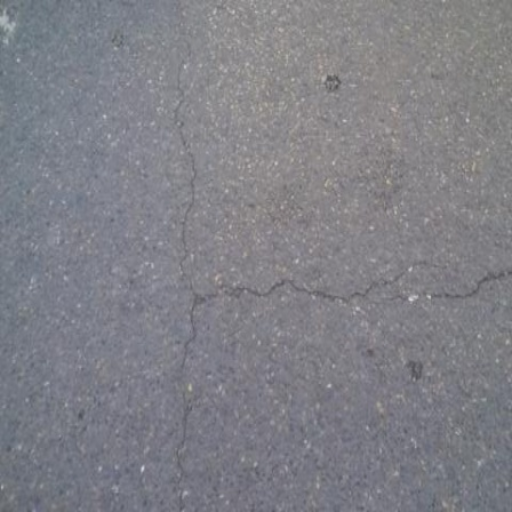

In [ ]:
img = ringsurface[1]

img = cv2.resize(img, (512,512))
cv2_imshow(img)

In [ ]:
def contrast_enhancement(img):
  lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
  l, a, b = cv2.split(lab)

  clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
  cl = clahe.apply(l) 

  limg = cv2.merge((cl,a,b)) 

  image_contrast = cv2.cvtColor(limg, cv2.COLOR_LAB2BGR)
  return image_contrast

In [ ]:
contrast_enhanced_images = []
for img in ringsurface:
  image_contrast = contrast_enhancement(img)
  contrast_enhanced_images.append(image_contrast)

ringsurface.clear()

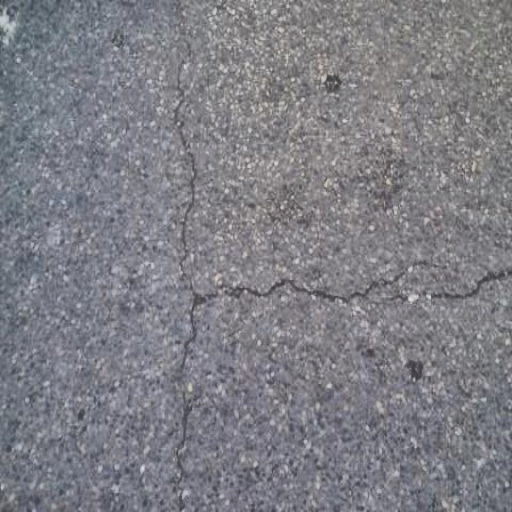

In [ ]:
img = contrast_enhanced_images[1]
resized_img = cv2.resize(img, (512,512))
cv2_imshow(resized_img)

## Image Sharpening

In [ ]:
def image_sharpening(img):
  kernel = np.array([[0, -1, 0],
                   [-1, 5,-1],
                   [0, -1, 0]])
  return cv2.filter2D(src=img, ddepth=-1, kernel=kernel)

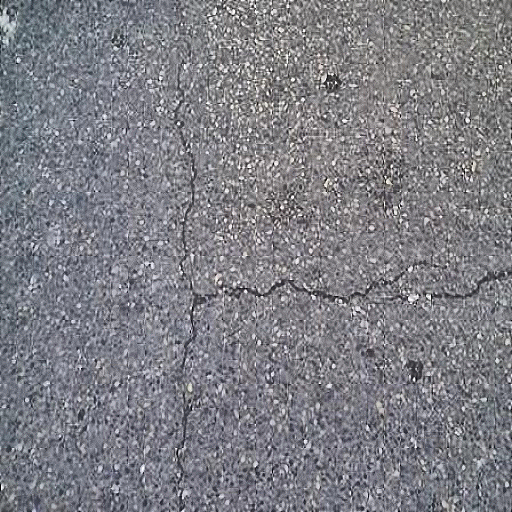

In [ ]:
sharpened_images = []
for img in contrast_enhanced_images:
  sharp_image = image_sharpening(img)
  sharpened_images.append(sharp_image)

contrast_enhanced_images.clear()
img = sharpened_images[1]
resized_img = cv2.resize(img, (512,512))

cv2_imshow(resized_img)

# Construction of Unet FCN

In [ ]:
def focal_loss(gamma=2., alpha=.25):
	def focal_loss_fixed(y_true, y_pred):
		pt_1 = tf.where(tf.equal(y_true, 1), y_pred, tf.ones_like(y_pred))
		pt_0 = tf.where(tf.equal(y_true, 0), y_pred, tf.zeros_like(y_pred))
		return -K.mean(alpha * K.pow(1. - pt_1, gamma) * K.log(pt_1+K.epsilon())) - K.mean((1 - alpha) * K.pow(pt_0, gamma) * K.log(1. - pt_0 + K.epsilon()))
	return focal_loss_fixed

In [ ]:

def unet3s2(pretrained_weights = None, input_size = (512, 512, 3)):
    input = Input(input_size)
    conv1 = Conv2D(64, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(input)
    conv1 = Conv2D(64, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)
    conv12 = Conv2D(128, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(UpSampling2D(size = (2,2))(pool1))
    
    conv2 = Conv2D(128, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(pool1)
    conv2 = Conv2D(128, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)
    conv13 = Conv2D(128, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(UpSampling2D(size = (4,4))(pool2))

    conv3 = Conv2D(256, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(pool2)
    conv3 = Conv2D(256, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv3)
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)
    conv4 = Conv2D(512, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(pool3)
    conv4 = Conv2D(512, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv4)
    conv14 = Conv2D(128, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(UpSampling2D(size = (8,8))(conv4))
    
    conv4 = Conv2D(512, 3, activation = 'relu', dilation_rate = (2, 2), padding = 'same', kernel_initializer = 'he_normal')(conv4)
    conv4 = Conv2D(512, 3, activation = 'relu', dilation_rate = (2, 2), padding = 'same', kernel_initializer = 'he_normal')(conv4)
    conv4 = Conv2D(512, 3, activation = 'relu', dilation_rate = (4, 4), padding = 'same', kernel_initializer = 'he_normal')(conv4)
    conv4 = Conv2D(512, 3, activation = 'relu', dilation_rate = (4, 4), padding = 'same', kernel_initializer = 'he_normal')(conv4)

    pool4 = MaxPooling2D(pool_size=(64, 64))(conv4)
    conv5 = Conv2D(128, 1, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(pool4)
    up5 = UpSampling2D(size = (512,512))(conv5)

    pool5 = MaxPooling2D(pool_size=(32, 32))(conv4)
    conv6 = Conv2D(128, 1, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(pool5)
    up6 = UpSampling2D(size = (256,256))(conv6)
    
    pool6 = MaxPooling2D(pool_size=(16, 16))(conv4)
    conv7 = Conv2D(128, 1, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(pool6)
    up7 = UpSampling2D(size = (128,128))(conv7)

    pool7 = MaxPooling2D(pool_size=(8, 8))(conv4)
    conv8 = Conv2D(128, 1, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(pool7)
    up8 = UpSampling2D(size = (64,64))(conv8)

    merge1 = concatenate([conv12, conv13, conv14, up5, up6, up7, up8], axis=3)
    conv9 = Conv2D(64, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(merge1)
    conv10 = Conv2D(2, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv9)
    conv11 = Conv2D(1, 1, activation = 'sigmoid')(conv10)

    model = Model(inputs = input, outputs = conv11)
    print('model compile')
    model.compile(optimizer = tf.keras.optimizers.Adam(lr = 1e-5), loss = [focal_loss(alpha=.25, gamma=2)], metrics = ['accuracy'])
    model.summary()
    if(pretrained_weights):
        model.load_weights(pretrained_weights)
        print ('loaded pretrained_weights ... {}'.format(pretrained_weights))

    return model

model = unet3s2()
print(model.summary())

model compile
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 512, 512, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 512, 512, 64  1792        ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 conv2d_1 (Conv2D)              (None, 512, 512, 64  36928       ['conv2d[0][0]']                 
                                )                                               

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


# Crack Segmentation

In [ ]:
def adjustData(img,mask,flag_multi_class,num_class):
    if(flag_multi_class):
        img = img / 255
        mask = mask[:,:,:,0] if(len(mask.shape) == 4) else mask[:,:,0]
        new_mask = np.zeros(mask.shape + (num_class,))
        for i in range(num_class):
            new_mask[mask == i,i] = 1
        new_mask = np.reshape(new_mask,(new_mask.shape[0],new_mask.shape[1]*new_mask.shape[2],new_mask.shape[3])) if flag_multi_class else np.reshape(new_mask,(new_mask.shape[0]*new_mask.shape[1],new_mask.shape[2]))
        mask = new_mask
    elif(np.max(img) > 1):
        img = img / 255
        mask = mask /255
        mask[mask > 0.5] = 1
        mask[mask <= 0.5] = 0
    return (img,mask)

In [ ]:

def trainGenerator(batch_size,train_path,image_folder,mask_folder,aug_dict,image_color_mode = "rgb",
                    mask_color_mode = "grayscale",image_save_prefix  = "image",mask_save_prefix  = "mask",
                    flag_multi_class = False,num_class = 2,save_to_dir = None,target_size = (512,512),seed = 1):
 
    image_datagen = ImageDataGenerator(**aug_dict)
    mask_datagen = ImageDataGenerator(**aug_dict)
    image_generator = image_datagen.flow_from_directory(
        train_path,
        classes = [image_folder],
        class_mode = None,
        color_mode = image_color_mode,
        target_size = target_size,
        batch_size = batch_size,
        save_to_dir = save_to_dir,
        save_prefix  = image_save_prefix,
        seed = seed)
    mask_generator = mask_datagen.flow_from_directory(
        train_path,
        classes = [mask_folder],
        class_mode = None,
        color_mode = mask_color_mode,
        target_size = target_size,
        batch_size = batch_size,
        save_to_dir = save_to_dir,
        save_prefix  = mask_save_prefix,
        seed = seed)
    train_generator = zip(image_generator, mask_generator)
    # return train_generator
    for (img,mask) in train_generator:
        img,mask = adjustData(img,mask,flag_multi_class,num_class)
        yield (img,mask)


print("loading data done")
data_gen_args = dict(rotation_range=20,
                    width_shift_range=0.05,
                    height_shift_range=0.05,
                    shear_range=0.15,
                    zoom_range=0.05,
                    horizontal_flip=True,
                    validation_split=0.2,
                    fill_mode='nearest')

train_generator = trainGenerator(2, '/content/drive/MyDrive/Dataset', 'train_img', 'train_lab', data_gen_args, save_to_dir = None)
history = model.fit_generator(train_generator, steps_per_epoch=math.ceil(9603/2), epochs=50)
model.save('cracksegmentor.pt')


Epoch 1/50
4802/4802 [==============================] - 11s 772ms/step - loss: 1.1071 - accuracy: 0.3125 - val_loss: 0.7021 - val_accuracy: 0.2694
Epoch 2/50
4802/4802 [==============================] - 11s 763ms/step - loss: 0.6763 - accuracy: 0.3558 - val_loss: 0.6372 - val_accuracy: 0.5463
Epoch 3/50
4802/4802 [==============================] - 12s 827ms/step - loss: 0.6341 - accuracy: 0.4196 - val_loss: 0.6600 - val_accuracy: 0.3102
Epoch 4/50
4802/4802 [==============================] - 12s 870ms/step - loss: 0.5586 - accuracy: 0.4879 - val_loss: 0.4617 - val_accuracy: 0.5231
Epoch 5/50
4802/4802 [==============================] - 12s 847ms/step - loss: 0.4736 - accuracy: 0.5813 - val_loss: 0.4920 - val_accuracy: 0.5415
Epoch 6/50
4802/4802 [==============================] - 12s 843ms/step - loss: 0.4131 - accuracy: 0.6200 - val_loss: 0.4204 - val_accuracy: 0.6435
Epoch 7/50
4802/4802 [==============================] - 11s 804ms/step - loss: 0.3288 - accuracy: 0.6724 - val_loss: 

In [ ]:
mymodel = load_model('cracksegmentor.pt')
folder_name = "/content/drive/MyDrive/Dataset/unlabelled_images/"
output_path = "/content/drive/MyDrive/Execution/Demo/"
mymodel.predict_all(folder_name , output_path)

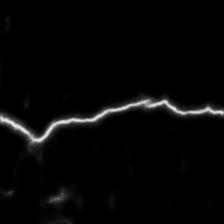

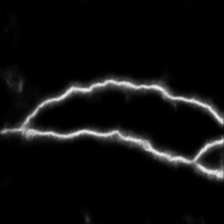

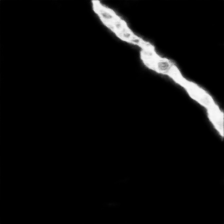

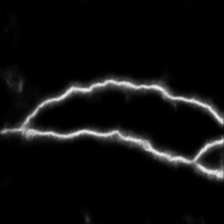

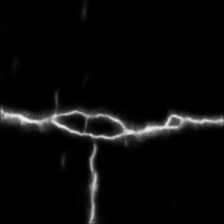

...

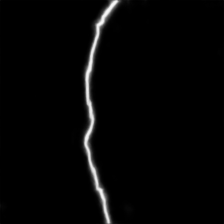

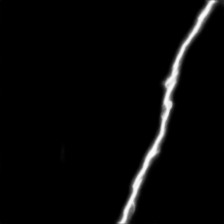

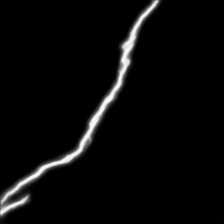

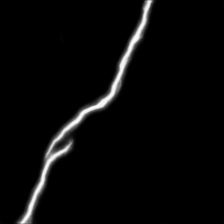

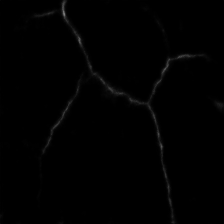

In [ ]:
RESULT_PATH = '/content/drive/MyDrive/Execution/Demo/'
result_list = os.listdir(RESULT_PATH)
result_list.sort()
for filename in result_list:
  img = cv2.imread(RESULT_PATH + filename)
  img = cv2.resize(img, (224, 224))
  cv2_imshow(img)
  print('\n')

# Testing

In [ ]:
from models import *
mymodel = load_model('cracksegmentor.pt')
folder_name = "/content/drive/MyDrive/Dataset/test_img/"
output_path = "/content/drive/MyDrive/Execution/"
mymodel.predict_all(folder_name , output_path)

In [ ]:
RESULT_PATH = '/content/drive/MyDrive/Execution/'
result_list = os.listdir(RESULT_PATH)
predicted_output = []
for filename in result_list:
  img = cv2.imread(RESULT_PATH + filename)
  predicted_output.append(img)
test_labels = os.listdir('/content/drive/MyDrive/Dataset/test_lab')
test_labels.sort()
actual_output = []
for filename in test_labels:
  img = cv2.imread('/content/drive/MyDrive/Dataset/test_lab/' + filename)
  actual_output.append(np.array(img))

prec_arr = []
rec_arr = []
f1_arr = []
iou_arr = []
TP_arr = []
TN_arr = []
FP_arr = []
FN_arr = []
table = [
         ['TP','TN','FP','FN', 'Precision', 'Recall', 'F1 Score', 'IOU']
]
for actual, predicted in zip(actual_output, predicted_output):
  TP = logical_and(pred = 1, act = 1)
  TN = logical_and(pred = 0, act = 0)
  FP = logical_and(pred = 1, act = 0)
  FN = logical_and(pred = 0, act = 1)
  TP_arr.append(TP)
  TN_arr.append(TN)
  FP_arr.append(FP)
  FN_arr.append(FN)
  precision = TP / (TP + FP)
  prec_arr.append(precision)
  recall = TP / (TP + FN)
  rec_arr.append(recall)
  f1_score = 2*precision*recall / (precision + recall)
  f1_arr.append(f1_score)
  iou = TP / (TP + FP + FN)
  iou_arr.append(iou)
  mtr = [TP, TN, FP, FN, precision, recall, f1_score, iou]
  for i in range(len(mtr)):
    mtr[i] = round(mtr[i], 6)
  table.append(mtr)

for row in table:
    print("{: >15} {: >15} {: >15} {: >15} {: >15} {: >15} {: >15} {: >15}".format(*row))

precision = sum(prec_arr) / len(prec_arr)
recall = sum(rec_arr) / len(rec_arr)
f1_score = sum(f1_arr) / len(f1_arr)
iou = sum(iou_arr) / len(iou_arr)

#for confusion matrix
TP = sum(TP_arr) / len(TP_arr)
TN = sum(TN_arr) / len(TN_arr)
FP = sum(FP_arr) / len(FP_arr)
FN = sum(FN_arr) / len(FN_arr)

print('Confusion Matrix\nTP=',TP, '\tFP=', FP, '\nFN=', FN, '\tTN=',TN)

print('Mean Average Precision: ', precision)
print('Mean Average Recall: ', recall)
print('Mean Average F1 Score: ', f1_score)
print('Mean Average IoU: ', iou)

             TP              TN              FP              FN       Precision          Recall        F1 Score             IOU
    3489.639248   571323.109861      348.810077      234.698962        0.909127        0.936982        0.922845        0.856743
     3112.96161   571067.483746      174.445781       157.89733        0.946935        0.951726        0.949325        0.903537
    2949.504918   566912.126988      320.581092      713.346826        0.901966        0.805248        0.850867        0.740443
     3528.98675   569590.658219      188.439178      584.463234        0.949309        0.857914        0.901301        0.820334
    3484.589129   571565.790884      278.077963       712.72912        0.926096        0.830194        0.875527         0.77861
    3757.991305   570826.022417      195.626433      201.534685         0.95052        0.949101         0.94981        0.904417
    2131.453286   571891.060847       88.667279      691.079691        0.960062        0.755156         

# Feature Extraction & Clustering

In [ ]:
import random,cv2,os,sys,shutil
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import numpy as np
import keras
from tensorflow.keras import applications
from scipy.spatial.distance import cdist
distortions=[]
inertias=[]
mapping1={}
mapping2={}
clustered_images = []
class image_clustering:
  def __init__(self, folder_path="data",n_clusters=2):
    paths = os.listdir(folder_path)
    self.max_examples=len(paths)
    self.n_clusters=n_clusters
    self.folder_path=folder_path
    random.shuffle(paths)
    self.image_paths=paths[:self.max_examples]
    del paths
    try:
      shutil.rmtree("output")
    except FileExistsError:
      pass
    os.makedirs("output")
    for i in range(self.n_clusters):
      os.makedirs("output/cluster" + str(i))
  def load_images(self):
    self.images=[]
    for image in self.image_paths:
      self.images.append(cv2.cvtColor(cv2.resize(cv2.imread(self.folder_path + "/" + image), (224,224)), cv2.COLOR_BGR2RGB))
    self.images = np.array(self.images, dtype='float') / 255.0
  def get_new_imagevectors(self):
    model1 = applications.resnet.ResNet50(include_top=False, weights='imagenet', input_shape=(224,224,3))
    pred = model1.predict(self.images)
    print(pred)
    images_temp = pred.reshape(self.images.shape[0], -1)
    self.images_new = images_temp
  def clustering(self, save_to_drive = False):
    model = KMeans(n_clusters=self.n_clusters,random_state=728)
    model.fit(self.images_new)
    predictions=model.predict(self.images_new)
    inertias.append(model.inertia_)
    mapping2[self.n_clusters]=model.inertia_
    if save_to_drive == True:
      for i in range(self.max_examples):
        shutil.copy2(self.folder_path + '/' + self.image_paths[i], 'output/cluster' + str(predictions[i]))
        clustered_images.append(predictions[i])

data_path = '/content/drive/MyDrive/Demo'
for number_of_clusters in range(1,10):
  temp = image_clustering(data_path,number_of_clusters)
  temp.load_images()
  temp.get_new_imagevectors()
  temp.clustering()

94781440/94765736 [==============================] - 0s 0us/step
[[[[0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 2.2373421e+00
    0.0000000e+00 0.0000000e+00]
   [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.9818748e+00
    0.0000000e+00 0.0000000e+00]
   [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.7507912e+00
    0.0000000e+00 0.0000000e+00]
   ...
   [0.0000000e+00 0.0000000e+00 6.3239634e-01 ... 2.6196208e+00
    0.0000000e+00 0.0000000e+00]
   [0.0000000e+00 0.0000000e+00 5.5532229e-01 ... 3.4078469e+00
    0.0000000e+00 0.0000000e+00]
   [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 4.2021265e+00
    0.0000000e+00 0.0000000e+00]]

  [[0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 0.0000000e+00
    0.0000000e+00 0.0000000e+00]
   [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 2.0284932e+00
    0.0000000e+00 0.0000000e+00]
   [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 8.1007361e-01
    0.0000000e+00 0.0000000e+00]
   ...
   [0.0000000e+00 0.0000000e+00 0.0000000e+00 

## Elbow method

1 : 904077.5
2 : 801848.625
3 : 735344.0625
4 : 685459.375
5 : 651244.0
6 : 623937.875
7 : 601416.25
8 : 575669.1875
9 : 561241.125


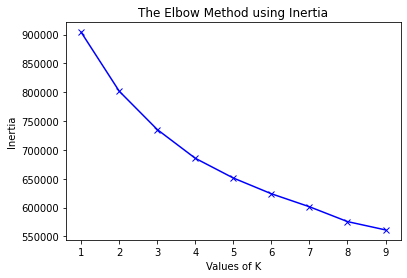

In [ ]:
import matplotlib.pyplot as plt
K=range(1,10)

for key, val in mapping2.items():
    print(f'{key} : {val}')

plt.plot(K, inertias, 'bx-')
plt.xlabel('Values of K')
plt.ylabel('Inertia')
plt.title('The Elbow Method using Inertia')
plt.show()

## Clustering with optimal k value

In [ ]:
temp = image_clustering(data_path,n_clusters=4)
temp.load_images()
temp.get_new_imagevectors()
temp.clustering(save_to_drive=True)

[[[[0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 2.2806613e+00
    0.0000000e+00 0.0000000e+00]
   [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.7580519e+00
    0.0000000e+00 0.0000000e+00]
   [0.0000000e+00 0.0000000e+00 6.3103557e-01 ... 3.1668212e+00
    0.0000000e+00 0.0000000e+00]
   ...
   [0.0000000e+00 0.0000000e+00 4.7831571e-01 ... 1.9221127e+00
    0.0000000e+00 0.0000000e+00]
   [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.7590396e+00
    0.0000000e+00 0.0000000e+00]
   [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 3.4974813e+00
    0.0000000e+00 0.0000000e+00]]

  [[0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 0.0000000e+00
    0.0000000e+00 0.0000000e+00]
   [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 2.1855478e+00
    0.0000000e+00 0.0000000e+00]
   [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 3.0175498e+00
    0.0000000e+00 0.0000000e+00]
   ...
   [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.4356828e+00
    0.0000000e+00 0.0000000e+00]
   [0.0000000e

## Obtaining skeletal image

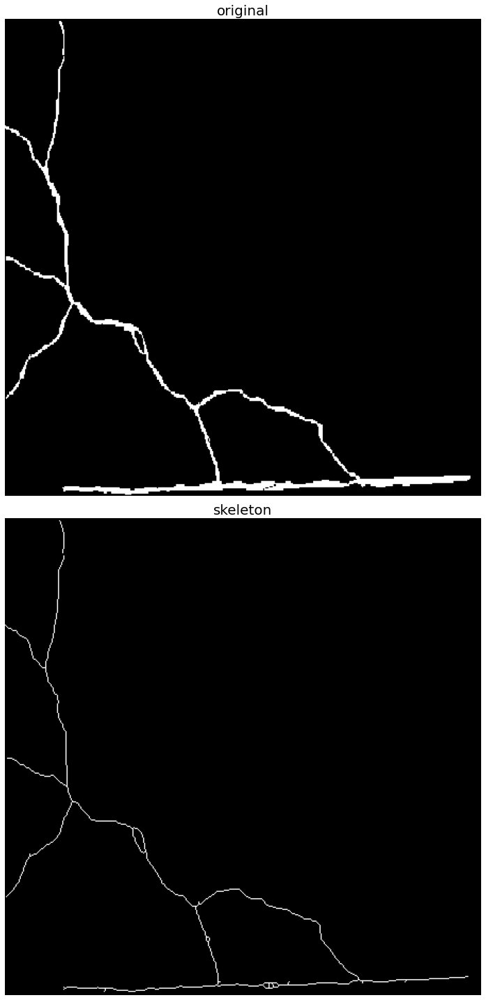

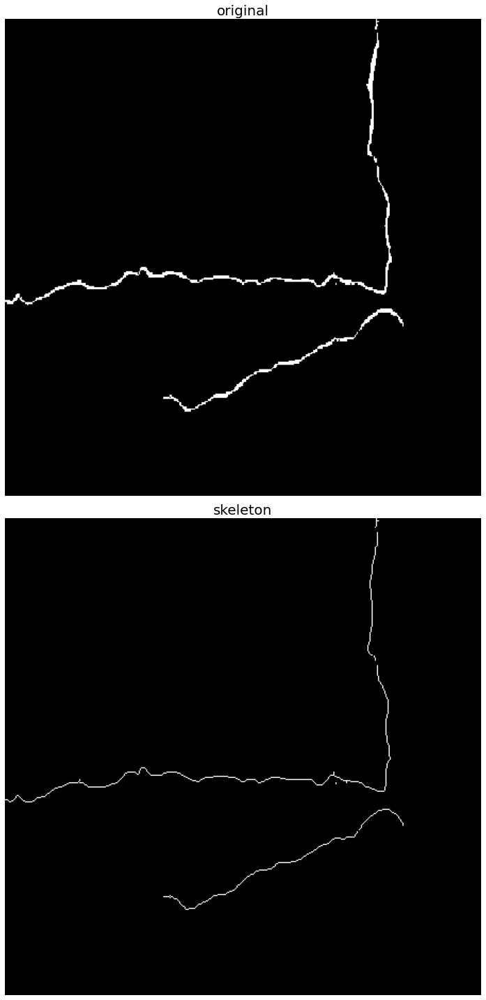

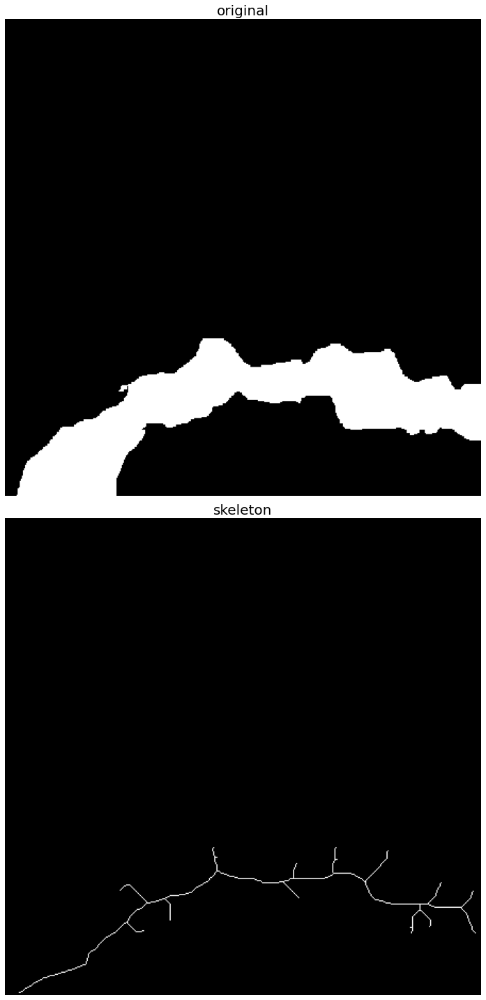

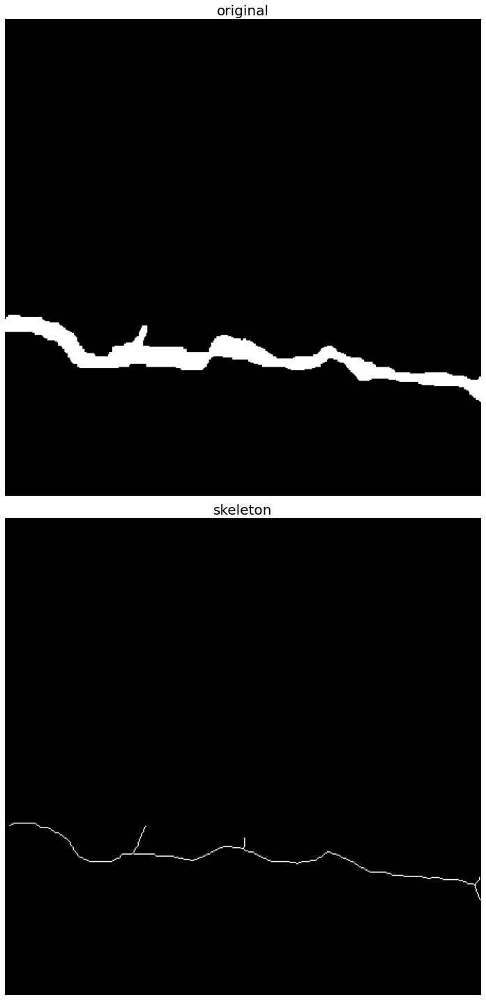

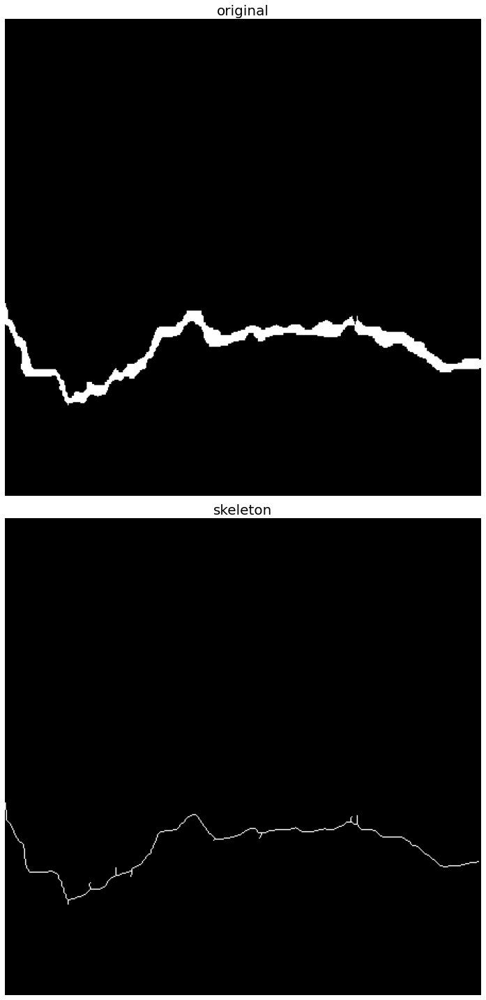

...

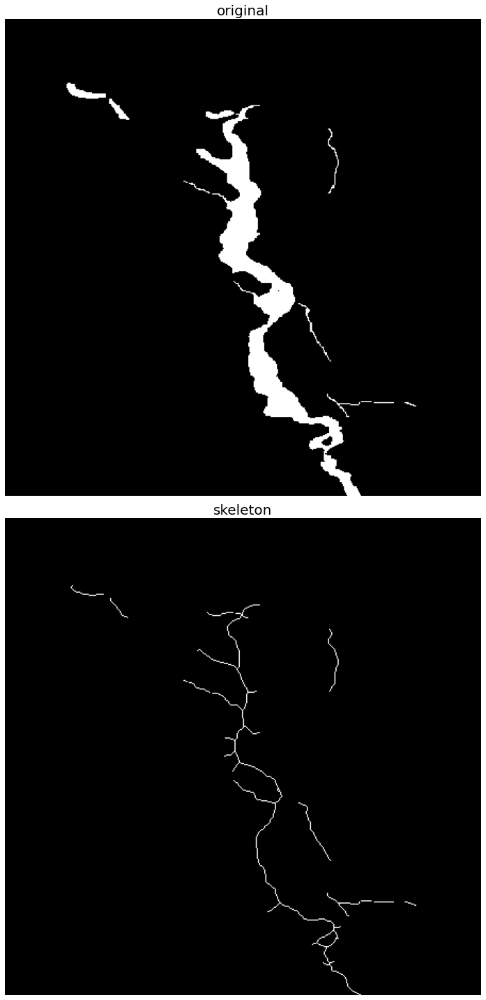

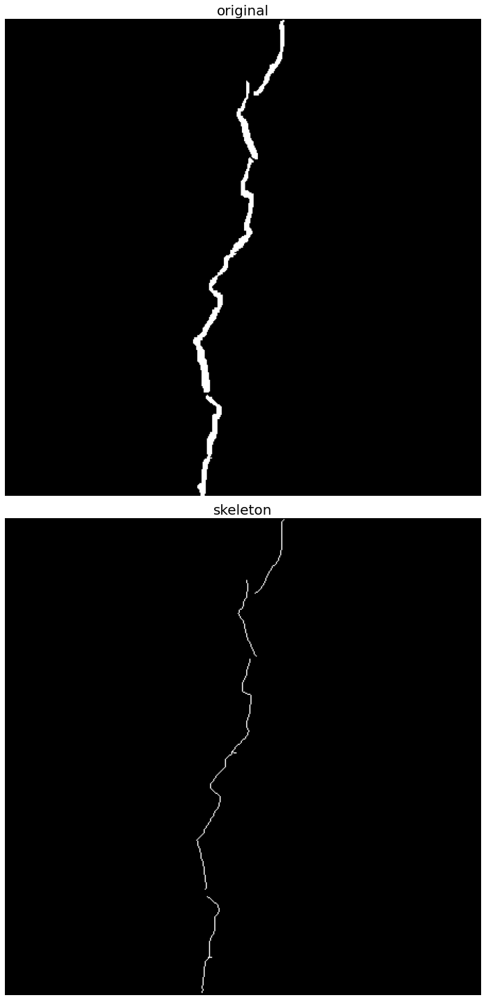

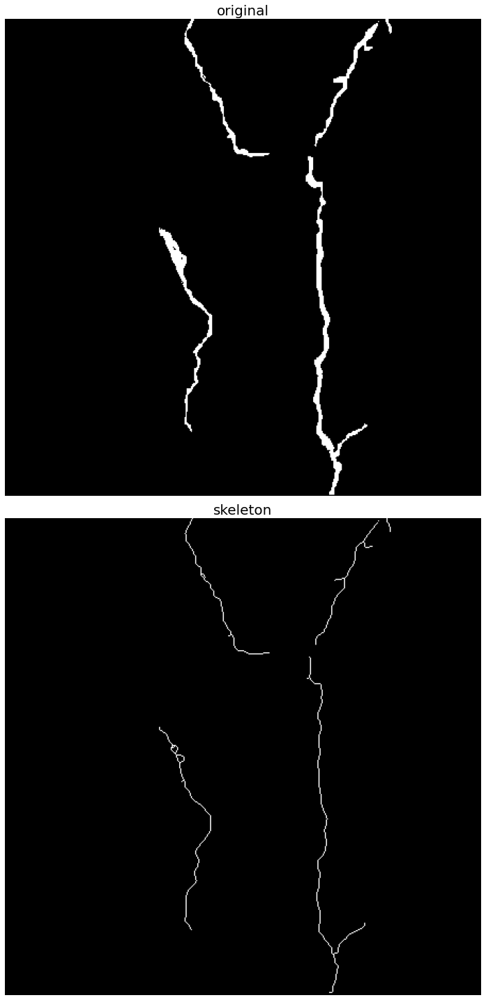

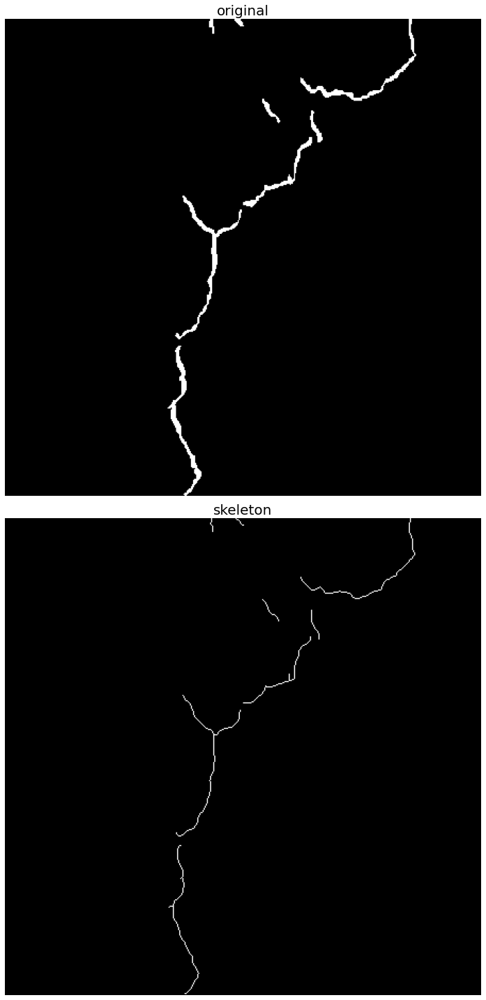

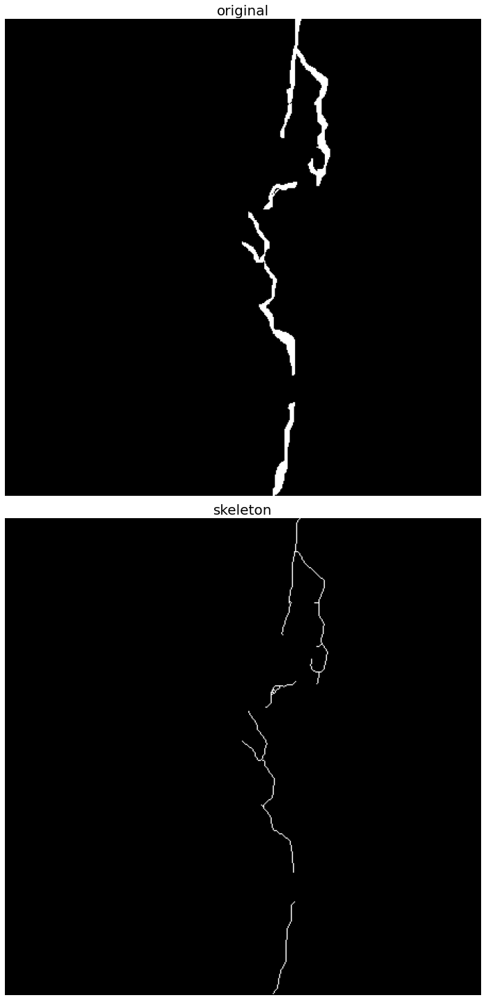

In [ ]:
path = '/content/drive/MyDrive/crack_segmentation/output/'
clusters = os.listdir(path)
clusters.sort()
clustered_images = []
area = []
lengths = []
for c in clusters:
  imgs = os.listdir(path + c)
  imgs.sort()
  cl = []
  area_i = []
  for fname in imgs:
    img = io.imread(path + c + '/' + fname)
    area_i.append(np.sum(img!=0))
    cl.append(img)
  area.append(area_i)
  clustered_images.append(cl)
for ci in clustered_images:
  lengths_i = []
  for i in ci:
    i[i<200] = 0
    i[i>=200] =1

    skeleton = skeletonize(i)
    lengths_i.append(np.sum(skeleton!=0))

    fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(40, 20), sharex=True, sharey=True)

    ax = axes.ravel()

    ax[0].imshow(i, cmap=plt.cm.gray)
    ax[0].axis('off')
    ax[0].set_title('original', fontsize=20)

    ax[1].imshow(skeleton, cmap=plt.cm.gray)
    ax[1].axis('off')
    ax[1].set_title('skeleton', fontsize=20)

    fig.tight_layout()
    plt.show()
  lengths.append(lengths_i)

## Edge detection

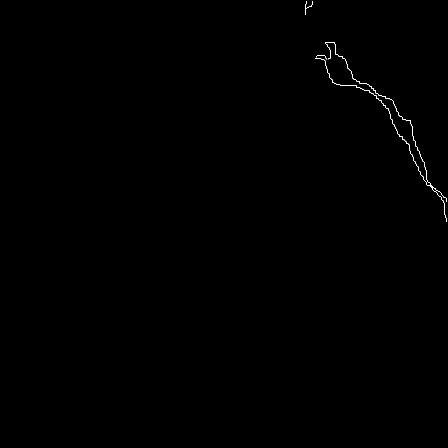

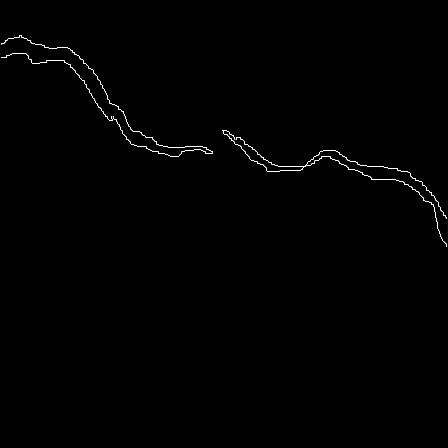

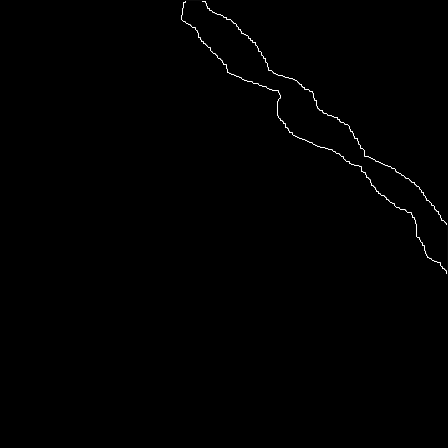

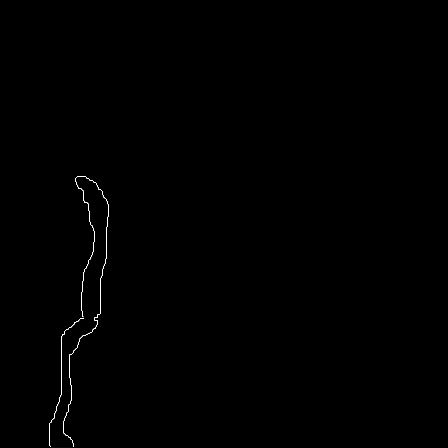

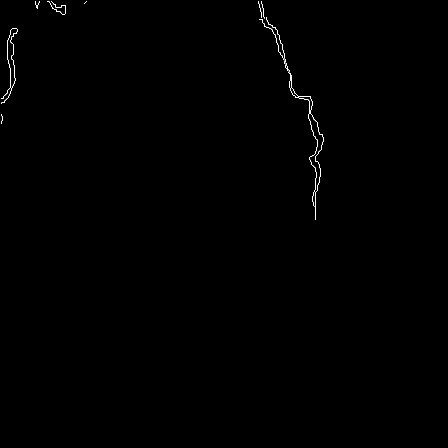

...

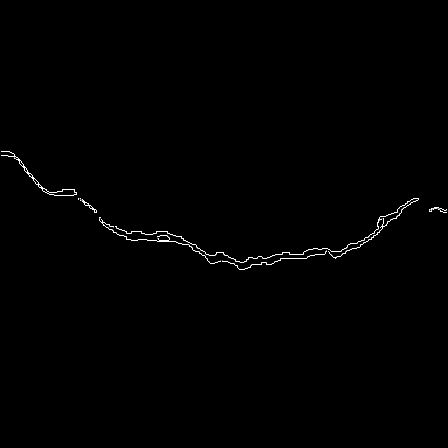

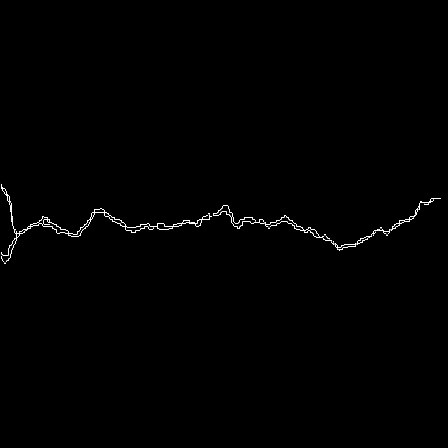

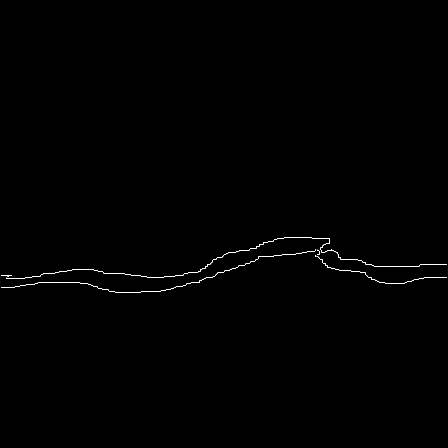

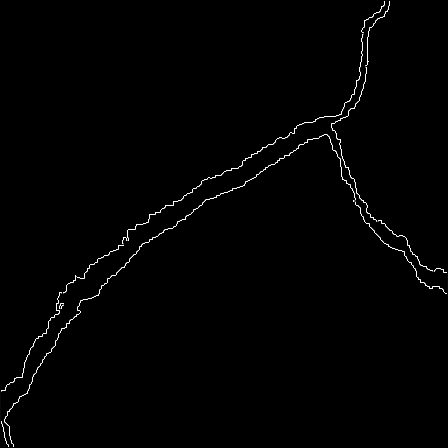

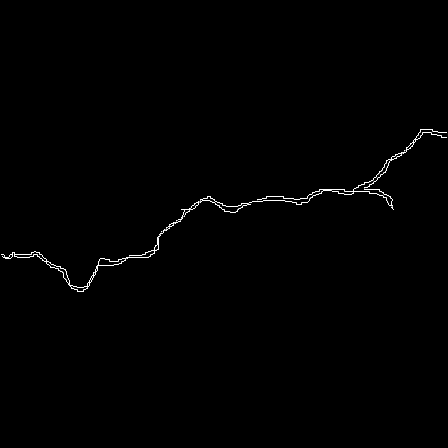

In [ ]:
from PIL import Image, ImageFilter, ImageEnhance
path = '/content/drive/MyDrive/crack_segmentation/output/'
clusters = os.listdir(path)
for c in clusters:
  imgs = os.listdir(path + c)
  cl = []
  for fname in imgs:
    img = Image.open(path + c + '/' + fname)
    img = np.array(img)
    img[img<200]=0
    img[img>=200]=1
    img=Image.fromarray(img)
    enhancer = ImageEnhance.Contrast(img)
    img = enhancer.enhance(10)

    enhancer = ImageEnhance.Sharpness(img)
    img = enhancer.enhance(50)

    img = img.filter(ImageFilter.FIND_EDGES)
    img = cv2.cvtColor(np.array(img), cv2.COLOR_RGB2BGR)
    cv2_imshow(img)

In [ ]:
k = 1
widths = []
width_arr = area
crack_width = []
for (i,j) in zip(area, lengths):
  k += 1
  sum=0
  arr = []
  for (i1, j1) in zip(i, j):
    arr.append(i1/j1)
    sum += (i1/j1)
  crack_width.append(arr)
  widths.append(sum / len(i))
critical_cluster = widths.index(max(widths))

In [ ]:
def get_width(a_x, a_y, b_x, b_y, p_x, p_y,edge):

	v_x = a_x - b_x
	v_y = a_y - b_y
	
	# normalising the direction
	norm = math.sqrt(v_x * v_x + v_y * v_y)
	v_x = v_x / norm
	v_y = v_y / norm

	temp = v_x
	v_x = 0-v_y
	v_y = temp

	p1_x = -1
	p1_y = -1
	for length in range(edge.shape[0]):
		c_x = int(p_x + v_x * length)
		c_y = int(p_y + v_y * length)

		if edge[c_x][c_y] == 1:
			p1_x = c_x
			p1_y = c_y

	p2_x = -1
	p2_y = -1
	for length in range(edge.shape[0]):
		d_x = int(p_x - v_x * length)
		d_y = int(p_y - v_y * length)	

		if edge[d_x][d_y] == 1:
			p2_x = c_x
			p2_y = c_y		
		
	width = math.sqrt((p1_x - p2_x) * (p1_x - p2_x) + (p1_y - p2_y) * (p1_y - p2_y))
  return width
		
def find_width(starting_points, point, skeletal, edge):

	widths = []
	
	neighbours = list_neigbours(skeletal, point)
	a_x = point[0]
	a_y = point[1]
	b_x = neighbour[0][0]
	b_y = neighbour[0][1]

	width = get_width(a_x, a_y, b_x, b_y,a_x, a_y, edge)
	widths.append(width)	

	prev_point = point
	point = neighbour[0]
	while point not in starting_points:
		a_x = neighbours[0][0]
		a_y = neighbours[0][1]

		b_x = neighbours[1][0]
		b_y = neighbours[1][1]
		width = get_width(a_x, a_y, b_x, b_y, point[0], point[1], edge)
		widths.append(width)

	starting_points[starting_points.find((point,False))][1] = True	
 	
	width_sum = 0
	for i in widths:
		width_sum += i
	
	average_width = width_sum / len(widths)
	
	return average_width	
	
def orthogonal_projection(skeletal, edge):
	
	# finding coordinates of white pixels in skeletal image  
	points = []
	for i in range(len(skeletal)):
		for j in range(len(skeletal[0])):
			if skeletal[i][j] == 1:
				points.append((i,j))

	starting_points = [] # points, isVisited
	actual_points = []
	for point in points:
		neighbours = countNeighbours(skeletal, point)
		if neighbours ==  1:
			starting_points.append((point, False))
		elif neighbours == 2:
			actual_points.append(point)
		else:
			neighbour_points = list_neighbours(skeletal, point)
			for point in neighbour_points:
				starting_points.append((point, False))	
	
	widths = []
	for i in range(len(starting_points)):
		if starting_point[i][1] == False:
			starting_point[i][1] = True
			widths.append( find_width(starting_points, starting_point[i][0], skeletal, edge) )    


	width_sum = 0
	for i in widths:
		width_sum += i
	
	average_width = width_sum / len(widths)
	
	return average_width	

clusters  = []
for c in total_clusters:
  widths = []
  for skeletal , edge in zip(c[skeletals], c[edges]):
    crack_width = othogonal_projection(skeletal,edge)
    widths.append(crack_width)
  clusters.append(widths)

In [ ]:
k=1
for i in range(len(crack_width)):
  print('cluster ', k)
  print(crack_width[i])
  k+=1
print('Averge width of all clusters:')
print(widths)
critical_clusters = widths.index(max(widths))
print('Critical cluster is ', critical_cluster+1)

cluster  1
[6.593916349809886, 6.200696055684455, 35.15568022440393, 16.365269461077844, 12.117132867132867, 14.078674948240165, 18.4, 17.073022312373226, 15.578849721706865, 13.769465648854961, 14.69375, 10.791831357048748, 25.826970443349754, 14.384769539078157, 10.829662261380323, 8.75416133162612, 8.0890756302521, 25.457971014492752]
cluster  2
[37.04892966360856, 12.754098360655737, 13.05892547660312, 8.656558533145276, 16.50537634408602, 7.8245125348189415, 11.211901306240929, 14.412921348314606, 25.485042735042736, 10.686131386861314, 9.71063829787234, 12.429166666666667, 13.520661157024794, 17.965317919075144, 14.195817490494296, 10.292217327459618, 17.63755980861244, 8.823970037453183, 7.0046728971962615, 18.137931034482758, 9.297741273100616, 7.53862660944206, 9.62295081967213, 7.582867783985103]
cluster  3
[8.234962406015038, 7.290581162324649, 7.093333333333334, 8.796349663784822, 7.294243070362473, 8.633832976445396, 7.679220779220779, 6.61863173216885, 7.086080586080586, 

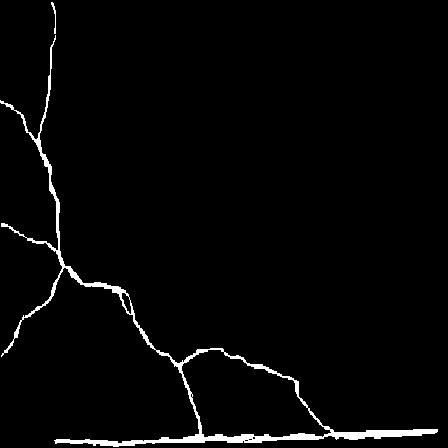

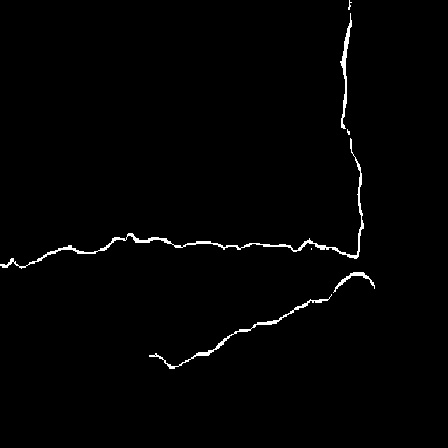

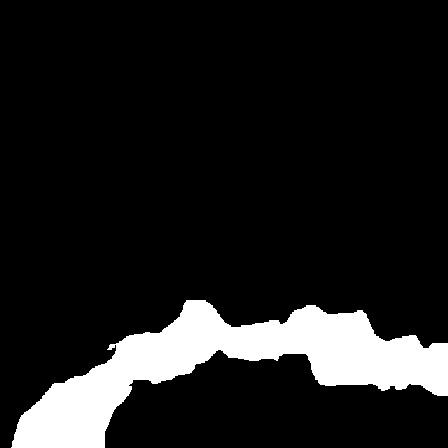

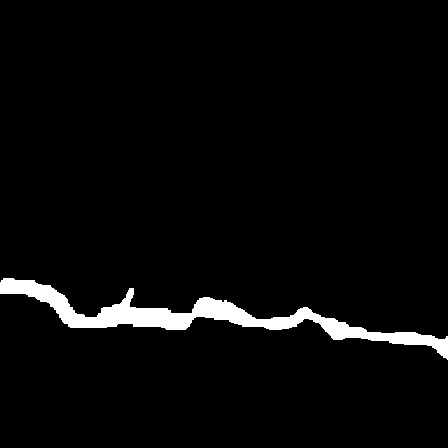

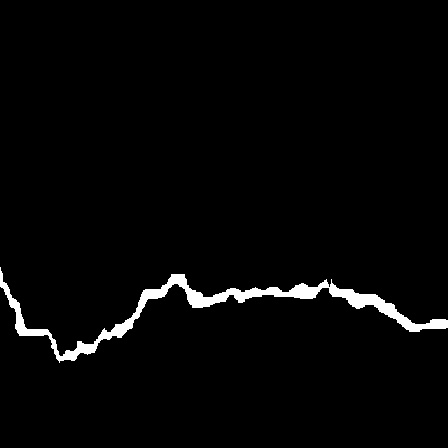

...

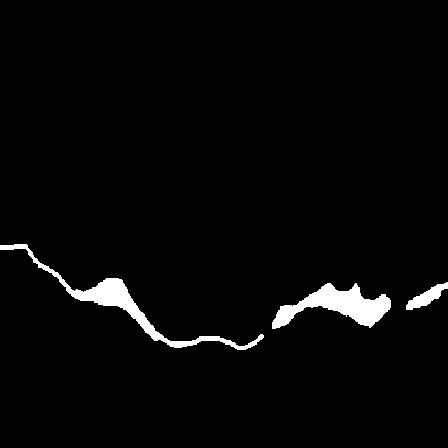

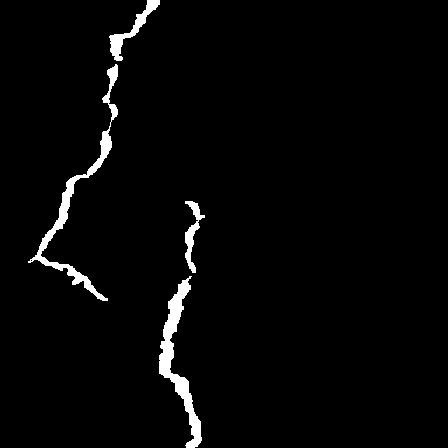

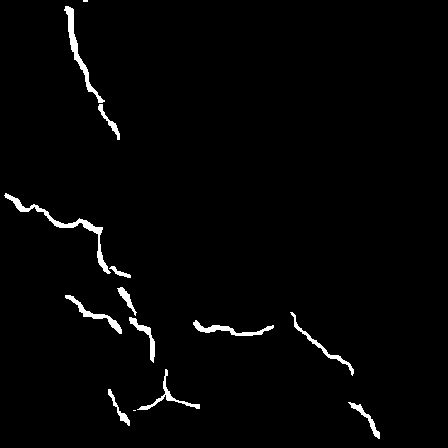

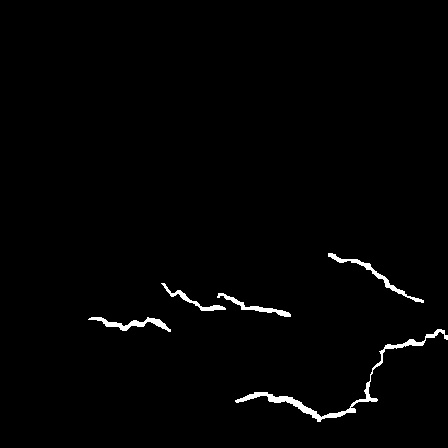

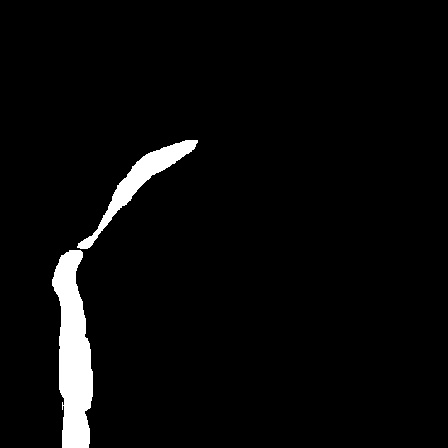

In [ ]:
path = '/content/drive/MyDrive/crack_segmentation/output/cluster' + str(critical_cluster) + '/'
files = os.listdir(path)
files.sort()
for img_name in files:
  img = cv2.imread(path + img_name)
  cv2_imshow(img)
  print()

# Test Cases and Evaluation

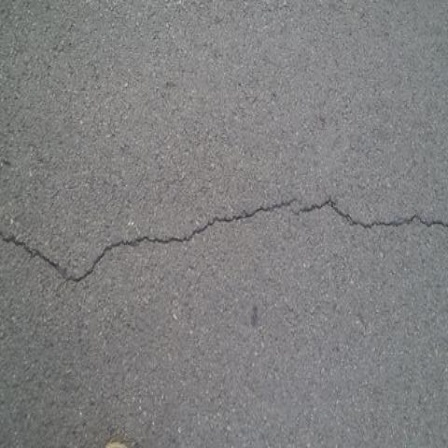

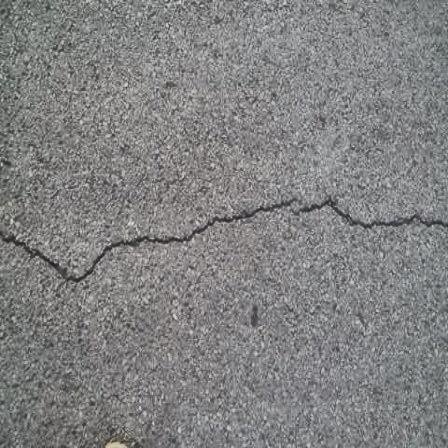

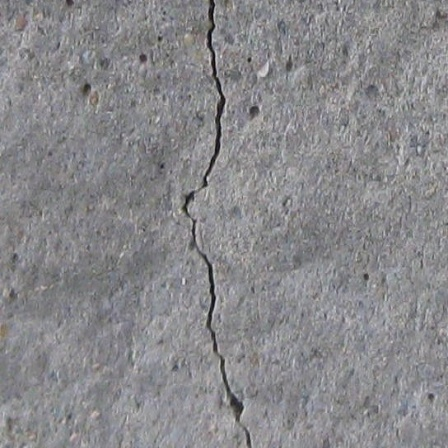

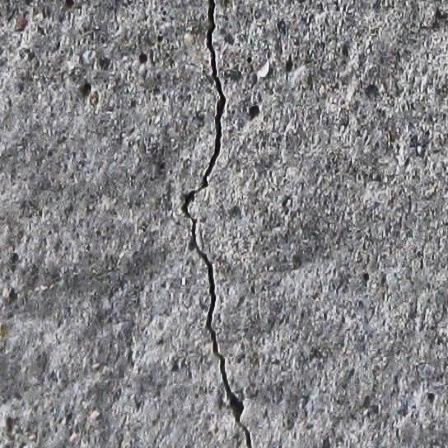

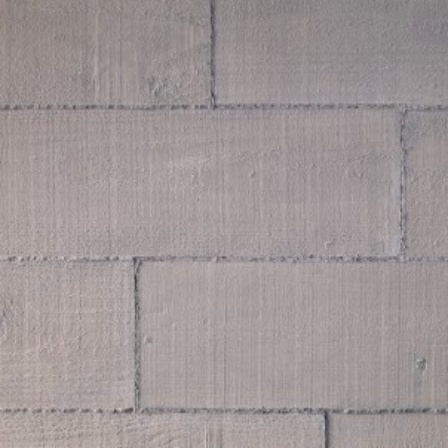

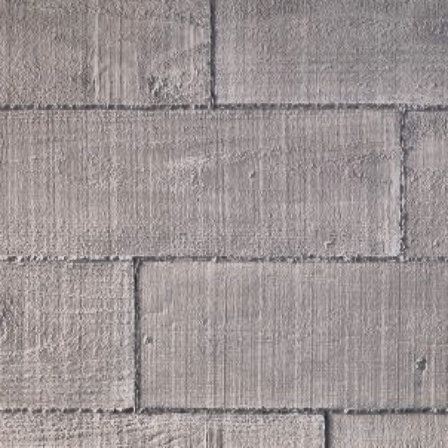

In [ ]:
images = ['CFD_001.jpg', 'DeepCrack_IMG25-6.jpg', 'noncrack_noncrack_concrete_wall_40_5.jpg.jpg']
contrast_enhanced = []
for x in images:
  img = cv2.imread('/content/drive/MyDrive/Dataset/test_img/' + x)
  cv2_imshow(img)
  img = contrast_enhancement(img)
  cv2_imshow(img)
  contrast_enhanced.append(img)

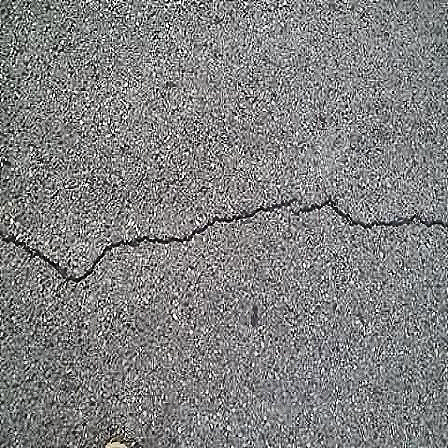

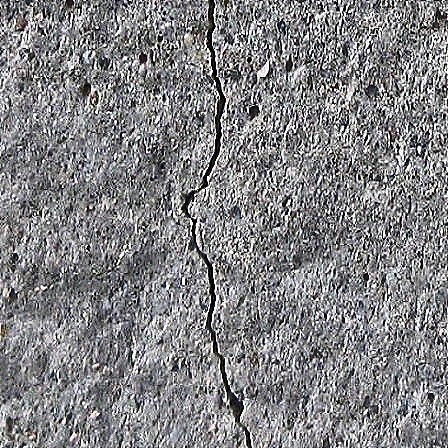

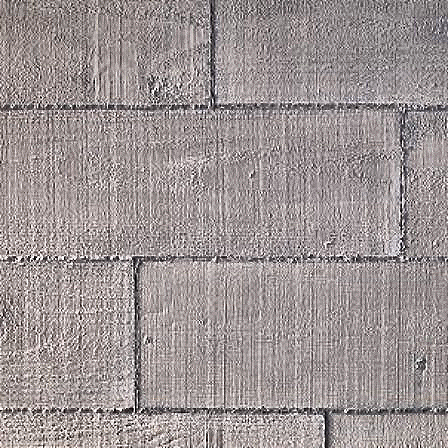

In [ ]:
sharpened = []
for img in contrast_enhanced:
  img = image_sharpening(img)
  cv2_imshow(img)
  sharpened.append(img)